Importing libraries

In [636]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as col
import numpy as np
import geopandas as gpd
import re
import seaborn as sns
from math import radians, sin, cos, sqrt, atan2
import matplotlib.dates as mdates
import requests
import folium
from geopy.distance import geodesic
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import scipy.stats as stats

In [637]:
os.chdir('/Users/Valerie/Desktop/Rental')

df = pd.read_csv('results_full.csv', sep=",", header = 0, encoding = 'utf-8')

## Data cleaning

Deleting duplicated ads (some could be pinned on the top of a few pages) using the link column:

In [638]:
data = df.drop_duplicates(subset=['Link'], keep='first')
data.reset_index(drop=True, inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7081 entries, 0 to 7080
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Neighbourhood  7081 non-null   object 
 1   Price          7081 non-null   object 
 2   Area           7081 non-null   object 
 3   Rooms          7081 non-null   object 
 4   Furniture      0 non-null      float64
 5   Building       5788 non-null   object 
 6   Floor          6906 non-null   object 
 7   Rent           4730 non-null   object 
 8   Latitude       7081 non-null   float64
 9   Longitude      7081 non-null   float64
 10  Adress         7081 non-null   object 
 11  Link           7080 non-null   object 
dtypes: float64(3), object(9)
memory usage: 664.0+ KB


Cleaning each column from incorrect values

In [639]:
data['Neighbourhood'].unique()

array(['Śródmieście', 'Bielany', 'Mokotów', 'Ursynów', 'Praga-Północ',
       'Praga-Południe', 'Wola', 'Białołęka', 'Ursus', 'Włochy', 'Bemowo',
       'Targówek', 'Żoliborz', 'Ochota', 'Wilanów', 'Wesoła',
       'warszawski zachodni', 'Wawer', 'Rembertów'], dtype=object)

In [640]:
data = data[~data['Neighbourhood'].isin(['warszawski zachodni'])]

In [641]:
data['Floor'].unique()

array(['3/11', '2/6', '4/11', '6/6', '4/6', '2', '2/4', '1/3', '> 10/15',
       'parter', '1/6', '2/11', 'parter/4', '3/3', '3/7', '4/7', '2/5',
       '1/4', '3/5', '2/3', '1/5', '5/5', '5', '> 10/11', '2/7', '4/9',
       '4/5', '2/2', '2/8', '4/8', '6/7', 'parter/6', '7/7', '4/4', '5/6',
       '> 10/22', '1/8', '6/9', 'parter/3', '3/6', '5/10', '1',
       'parter/5', '10/22', '8/9', '> 10/18', '5/7', 'suterena',
       '> 10/52', '> 10/17', '3/4', '3', '5/8', '9/11', '7/15', '6', nan,
       '7', '8/11', '6/23', '> 10/16', '4', '> 10/25', '7/12', '5/9',
       '1/10', '7/10', '6/8', '3/10', '2/10', '5/11', '3/8', '4/10',
       '1/7', '9/9', '8/8', '4/12', '8/15', '9/10', '1/2', '7/25', '6/10',
       '8/10', 'parter/2', '> 10/50', '1/14', '7/8', '9', '10/10', '2/13',
       '1/1', '1/16', 'parter/10', '8/12', '3/12', '10/11', 'parter/7',
       '6/11', '6/18', '3/13', '> 10/14', '> 10/27', '> 10/24', '> 10/26',
       '> 10/44', '> 10/13', '2/12', '10/17', '5/15', '2/16', '9/13'

In [642]:
#replacing everything after '/'

data['Floor'] = data['Floor'].str.replace(r'/.*', '')
data['Floor'].unique()

array(['3', '2', '4', '6', '1', '> 10', 'parter', '5', '7', '10', '8',
       'suterena', '9', nan, 'poddasze'], dtype=object)

In [643]:
print(data['Floor'].isna().sum())
print(data['Floor'].isin(['poddasze']).sum())

175
1


In [644]:
#Encoding 'parter' and 'suterena' as 0 and -1 respectively;
#deleting irrelevant values:

data['Floor'] = data['Floor'].str.replace(r'Parter', '0', case=False)
data['Floor'] = data['Floor'].str.replace(r'Suterena', '-1', case=False)
data = data[~data['Floor'].isin(['poddasze'])]

Defining which columns should contain only numeric values, replacing all non-digit characters in the numeric columns and transforming each value to numeric:

In [645]:
numeric_columns = ['Price', 'Area', 'Rooms', 'Floor', 'Rent']

In [646]:
data[numeric_columns] = data[numeric_columns].apply(lambda x: x.str.replace(',', '.', regex=True))
data[numeric_columns] = data[numeric_columns].apply(lambda x: x.str.replace(r'[^0-9.,]', '', regex=True))
data[numeric_columns] = data[numeric_columns].apply(lambda x: pd.to_numeric(x, errors = 'coerce'))

In [647]:
data

,Neighbourhood,Price,Area,Rooms,Furniture,Building,Floor,Rent,Latitude,Longitude,Adress,Link
0,Śródmieście,2999.0,27.15,1,NaN,apartamentowiec,3.0,NaN,52.251517,20.994202,"ul. Stanisława Dubois, Muranów, Śródmieście, W...",https://otodom.pl/pl/oferta/studio-bezposredni...
1,Bielany,2200.0,34.00,1,NaN,blok,2.0,2200.0,52.273979,20.907714,"ul. Księżycowa 58, Chomiczówka, Bielany, Warsz...",https://otodom.pl/pl/oferta/bielany-chomiczowk...
2,Mokotów,3100.0,24.00,1,NaN,blok,4.0,4200.0,52.178482,21.030110,"Pohoskiego 1, Ksawerów, Mokotów, Warszawa, maz...",https://otodom.pl/pl/oferta/kawalerka-bez-prow...
3,Śródmieście,4400.0,45.00,2,NaN,apartamentowiec,6.0,5000.0,52.233130,21.019000,"Śródmieście Północne, Śródmieście, Warszawa, m...",https://otodom.pl/pl/oferta/apartament-solec-r...
4,Ursynów,7900.0,120.00,4,NaN,apartamentowiec,4.0,8500.0,52.137850,21.029120,"Alterntywy, Pyry, Ursynów, Warszawa, mazowieckie",https://otodom.pl/pl/oferta/wysoki-standard-me...
...,...,...,...,...,...,...,...,...,...,...,...,...
7076,Wola,2950.0,50.00,2,NaN,apartamentowiec,1.0,NaN,52.234752,20.959559,"ul. Sokołowska, Młynów, Wola, Warszawa, mazowi...",https://otodom.pl/pl/oferta/komfortowe-2-pokoj...
7077,Śródmieście,5500.0,62.00,3,NaN,NaN,1.0,NaN,52.227564,21.018031,"Śródmieście Południowe, Śródmieście, Warszawa,...",https://otodom.pl/pl/oferta/mieszkanie-62-m-wa...
7078,Śródmieście,13000.0,145.00,4,NaN,apartamentowiec,4.0,NaN,52.209306,21.030407,"ul. Lądowa, Ujazdów, Śródmieście, Warszawa, ma...",https://otodom.pl/pl/oferta/4-pok-przy-lazienk...
7079,Wola,3000.0,38.02,1,NaN,blok,3.0,NaN,52.238920,20.993432,"ul. Elektoralna, Mirów, Wola, Warszawa, mazowi...",https://otodom.pl/pl/oferta/duze-studio-w-samy...


Expanding data from an adress column into few columns to extract the 'MSI obszar' column for more precise analysis:

* MSI (Miejski System Informacyjny) - the division of the areas into smaller units

In [648]:
data_expanded = data['Adress'].str.split(', ', expand=True)

In [649]:
data = pd.concat([data, data_expanded], axis=1)
data.reset_index(drop=True, inplace = True)

Creating 'MSI' column

In [650]:
#Defining 'Miejski System Informacyjny' areas list

msi = ["Czechowice", "Gołąbki", "Niedźwiadek", "Skorosze", "Szamoty", "Dąbrówka", "Grabów", "Jeziorki Północne", 
"Jeziorki Południowe", "Kabaty", "Natolin", "Pyry", "Skarpa Powsińska", "Stary Służew", "Stary Imielin", 
"Las Kabacki", "Ursynów-Centrum", "Ursynów Północny", "Wyczółki", "Groszówka", 
"Plac Wojska Polskiego", "Stara Miłosna", "Wesoła-Centrum", "Wola Grzybowska", "Zielona-Grzybowa", "Aleksandrów",
"Anin", "Falenica", "Las", "Marysin Wawerski", "Miedzeszyn", "Międzylesie", "Nadwiśle", "Radość", "Sadul", "Wawer",
"Zerzeń", "Nowe Włochy", "Okęcie", "Opacz Wielka", "Paluch", "Raków", "Salomea", "Stare Włochy", "Załuski", "Augustówka", 
"Czerniaków", "Ksawerów", "Służew", "Służewiec", "Sadyba", "Siekierki", "Sielce", "Stary Mokotów", "Stegny", "Wierzbno", 
"Wyględów", "Filtry", "Rakowiec", "Stara Ochota", "Szczęśliwice", "Czyste", "Koło", "Młynów", "Mirów", "Nowolipki", "Odolany", 
"Powązki", "Ulrychów", "Bemowo-Lotnisko", "Boernerowo", "Chrzanów", "Fort Bema", "Fort Radiowo", "Górce", "Groty", 
"Jelonki Północne", "Jelonki Południowe", "Lotnisko", "Muranów", "Nowe Miasto", "Powiśle", "Solec", "Stare Miasto", 
"Śródmieście Północne", "Śródmieście Południowe", "Ujazdów", "Kawęczyn-Wygoda", "Nowy Rembertów", "Stary Rembertów", 
"Białołęka Dworska", "Brzeziny", "Choszczówka", "Dąbrówka Szlachecka", "Grodzisk", "Henryków", "Kobiałka", "Nowodwory", 
"Szamocin", "Tarchomin", "Żerań", "Nowa Praga", "Pelcowizna", "Stara Praga", "Szmulowizna", "Gocław", "Gocławek", "Grochów", 
"Kamionek", "Olszynka Grochowska", "Saska Kępa", "Elsnerów", "Bródno", "Bródno-Podgrodzie", "Targówek Fabryczny", "Targówek Mieszkaniowy", 
"Zacisze", "Utrata", "Żoliborz", "Marymont-Potok", "Stary Żoliborz", "Sady Żoliborskie", "Chomiczówka", "Huta", 
"Las Bielański", "Młociny", "Marymont-Kaskada", "Marymont-Ruda", "Piaski", "Placówka", "Radiowo", "Słodowiec", "Stare Bielany", "Wólka Węglowa",
"Wawrzyszew", "Wrzeciono", "Wilanów Wysoki", "Wilanów Niski", "Wilanów Królewski",  "Błonia Wilanowskie",  "Powsinek",  
"Zawady",  "Kępa Zawadowska",  "Powsin"
]

#Checking if there is any irrelevant data in the column with msi areas:
print(data.iloc[[i not in msi for i in data[1]]])

     Neighbourhood   Price   Area  Rooms  Furniture          Building  Floor  \
3      Śródmieście  4400.0   45.0      2        NaN   apartamentowiec    6.0   
15         Ursynów  3100.0   52.1      2        NaN              blok    0.0   
35          Ochota  4900.0   70.0      3        NaN   apartamentowiec    2.0   
39     Śródmieście  8700.0  115.0      3        NaN   apartamentowiec    3.0   
40         Mokotów  2900.0   65.0      3        NaN              blok    6.0   
...            ...     ...    ...    ...        ...               ...    ...   
7023        Wesoła  9900.0  360.0      6        NaN  dom wolnostojący    NaN   
7026   Śródmieście  7000.0   55.0      2        NaN         kamienica    4.0   
7044   Śródmieście  4900.0   56.0      2        NaN               NaN    4.0   
7071   Śródmieście  5500.0   62.0      3        NaN               NaN    1.0   
7074        Bemowo  2400.0    4.0      1        NaN   apartamentowiec    0.0   

        Rent   Latitude  Longitude  ...

In [651]:
#Due to the non-unified system of providing the adress some values are placed in the different columns, 
#therefore we have to create a function which would find the correct values and return them to the MSI column:

def search_msi(row):
    if row[0] in msi:
        return row[0]
    elif row[2] in msi:
        return row[2]
    else:
        return row[1]

data[1] = data.apply(search_msi, axis=1)

#Checking if there is still any irrelevant data:
print(data[[0, 1]].iloc[[i not in msi for i in data[1]]])

                                                      0                1
73                 ul. Batalionu AK Karpaty ,Czerniaków          Mokotów
77                                          Tyniecka 28  02-615 Warszawa
160                   ul. Jana Bytnara Rudego ,Wierzbno          Mokotów
327                       al. Aleja Solidarności ,Mirów             Wola
761                   ul. Dywizjonu AK Jeleń ,Siekierki          Mokotów
772                   ul. Dywizjonu AK Jeleń ,Siekierki          Mokotów
816                                        Moje Miejsce             None
1018                      al. Aleja Solidarności ,Mirów             Wola
1128                    ul. Grupy AK Północ ,Czerniaków          Mokotów
1143                  ul. Dywizjonu AK Jeleń ,Siekierki          Mokotów
1311      ul. gen. Augusta Emila Fieldorfa Nila ,Gocław   Praga-Południe
1434                    al. Aleja Solidarności ,Muranów      Śródmieście
1617                    al. Aleja Solidarności ,Mur

In [652]:
#Taking msi from column with a street name:

def extract_location(row):
    try: 
        return row[0].split(',')[1] if row[1] not in msi else row[1]
    except: 
        return row[1]

data[1] = data.apply(extract_location, axis=1)
print(data.iloc[[i not in msi for i in data[1]]])

     Neighbourhood   Price  Area  Rooms  Furniture         Building  Floor  \
77     Śródmieście  1550.0  80.0      2        NaN             blok    1.0   
816        Mokotów  3000.0  33.0      1        NaN              NaN    2.0   
3214       Mokotów  4200.0  50.0      2        NaN  apartamentowiec    5.0   

        Rent   Latitude  Longitude  ...  \
77    3100.0  52.236140  21.008170  ...   
816      NaN  52.192493  21.045796  ...   
3214  5000.0  52.204565  20.993870  ...   

                                                   Link             0  \
77    https://otodom.pl/pl/oferta/mieszkanie-2-5-pok...   Tyniecka 28   
816                                                 NaN  Moje Miejsce   
3214  https://otodom.pl/pl/oferta/mieszkanie-na-osie...        Żaryna   

                    1             2                     3            4  \
77    02-615 Warszawa         Polen  Śródmieście Północne  Śródmieście   
816              None          None                  None         None   

In [653]:
#2 incorrect rows left: changing data in one row and deliting another row 

data.drop([77, 816], inplace=True)
data[1][3214] = "Wyględów"

#Removing unnecessary columns and renaming MSI column:

data = data.drop(columns = [0, 2, 3, 4, 5, 6, 7, 8])
data.rename(columns={1: 'MSI'}, inplace=True)
data.reset_index(drop=True, inplace=True)

## Working with missing values

In [654]:
data.shape

(7073, 13)

Creating a dataframe with counts of missing values in each column and their percentage values

In [655]:
null_count = data.isnull().sum()
null_percentage = round((data.isnull().sum()/data.shape[0])*100, 2)

null_df = pd.DataFrame({'column_name' : data.columns,'null_count' : null_count,'null_percentage': null_percentage})
null_df.reset_index(drop = True, inplace = True)

null_df.sort_values(by = 'null_percentage', ascending = False)

,column_name,null_count,null_percentage
4,Furniture,7073,100.00
7,Rent,2349,33.21
5,Building,1292,18.27
6,Floor,175,2.47
0,Neighbourhood,0,0.00
1,Price,0,0.00
2,Area,0,0.00
3,Rooms,0,0.00
8,Latitude,0,0.00
9,Longitude,0,0.00


In [656]:
data.drop(columns = ['Furniture'], inplace = True)

Imputing na's in floor column

In [657]:
print(data['Floor'].value_counts())
print(data['Floor'].describe())

1.0     1252
2.0     1213
3.0     1047
4.0      810
0.0      621
5.0      575
10.0     448
6.0      384
7.0      232
8.0      182
9.0      134
Name: Floor, dtype: int64
count    6898.000000
mean        3.479849
std         2.741211
min         0.000000
25%         1.000000
50%         3.000000
75%         5.000000
max        10.000000
Name: Floor, dtype: float64


In [658]:
data['Floor'].fillna(data['Floor'].median(), inplace=True)

Working with Building column

In [659]:
data['Building'].value_counts()

apartamentowiec     2501
blok                2398
kamienica            778
dom wolnostojący      60
szeregowiec           32
loft                   7
plomba                 5
Name: Building, dtype: int64

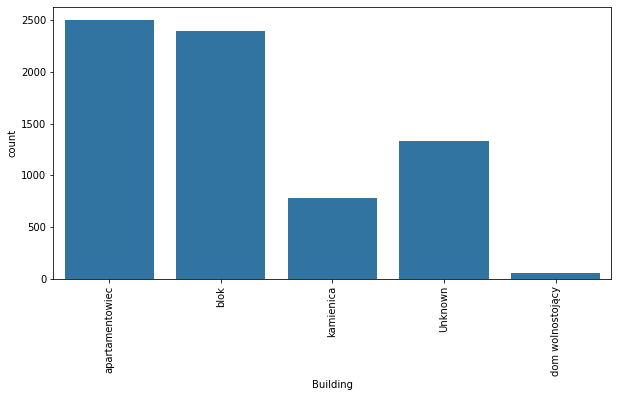

In [660]:
data['Building'].fillna(value = 'Unknown', inplace = True)
data.Building = data.Building.apply(lambda x: 'Unknown' if x in ['loft', 'plomba', 'szeregowiec'] else x)

plt.figure(figsize = (10,5))
sns.countplot(data = data, x = "Building")
plt.xticks(rotation = 90)
plt.show()

Cleaning Rent column

In [661]:
data['Rent'].describe(percentiles = [0.75,0.99,0.999])

count     4724.000000
mean      6576.844052
std       6690.623656
min          1.000000
50%       4600.000000
75%       7000.000000
99%      35770.000000
99.9%    71385.000000
max      90000.000000
Name: Rent, dtype: float64

Creating a function that displays distribution graph together with boxplot

In [662]:
import warnings

def dist_box(dataset, column):
    with warnings.catch_warnings():
      warnings.simplefilter("ignore")

      plt.figure(figsize=(16,6))

      plt.subplot(1,2,1)
      sns.distplot(dataset[column], color = 'purple')
      pltname = 'Disttribution graph for ' + column
      plt.ticklabel_format(style='plain', axis='x')
      plt.title(pltname)

      plt.subplot(1,2,2)
      red_diamond = dict(markerfacecolor='r', marker='D')
      sns.boxplot(y = column, data = dataset, flierprops = red_diamond)
      pltname = 'Boxplot for ' + column
      plt.title(pltname)

      plt.show()

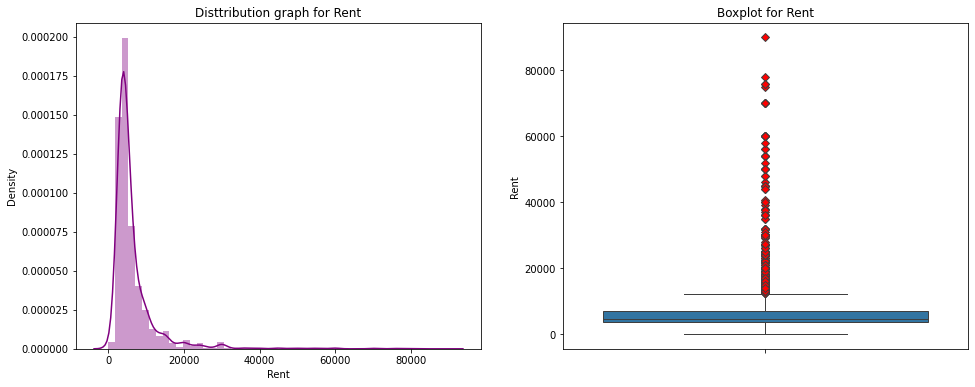

In [663]:
dist_box(data, 'Rent')

In [664]:
#calculating the inter-quantile range 

Q1 = data['Rent'].quantile(0.25)
Q3 = data['Rent'].quantile(0.75)
IQR = Q3 - Q1

Min_value = (Q1 - 1.5 * IQR)
Max_value = (Q3 + 1.5 * IQR)
print("Min value {}".format(Min_value))
print("Max value {}".format(Max_value))

Min value -1750.0
Max value 12250.0


In [665]:
data['Rent'].sort_values().unique()[:10]

array([  1.,   2.,   3.,   5.,   6.,   9.,  10.,  12.,  18., 300.])

In [666]:
data['Rent'].mode()[0]

4000.0

Imputing Rent column with mode values

In [667]:
data['Rent'].fillna(value = data['Rent'].mode()[0], inplace = True)
data['Rent'] = data['Rent'].apply(lambda x: data['Rent'].mode()[0] if x<300 or x>12250 else x)

## EDA

**Working with numeric features**

Cleaning the Price column

In [668]:
data['Price'].describe()

count     7073.000000
mean      5631.434099
std       5141.808132
min        300.000000
25%       3000.000000
50%       3990.000000
75%       5900.000000
max      50000.000000
Name: Price, dtype: float64

Minimum value is unrealisticly low: there probably are advertisements of rooms, not flats in the dataset.
Let's check 20 lowest values:

In [669]:
result = "\n".join([f"{data.sort_values(by='Price')['Link'].iloc[i]} {data.sort_values(by='Price')['Price'].iloc[i]}" for i in range(20)])
print(result)

https://otodom.pl/pl/oferta/parking-miejsce-postojowe-garaz-ul-konstruktorska-ID4pwHi 300.0
https://otodom.pl/pl/oferta/luksusowy-apartament-103m2-z-4-pokoje-ID4pR7P 450.0
https://otodom.pl/pl/oferta/mieszkanie-42-m-warszawa-ID4pO1i 1400.0
https://otodom.pl/pl/oferta/mieszkanie-taniej-o-1000zl-w-zamian-za-prace-ID4pEoa 1500.0
https://otodom.pl/pl/oferta/pokoj-18m-400m-od-metra-trocka-zacisze-ID4pFgr 1500.0
https://otodom.pl/pl/oferta/kawalerka-w-dzielnicy-wesola-w-warszawie-ID4pHWj 1500.0
https://otodom.pl/pl/oferta/pokoj-12-5-m2-do-wynajecia-na-bemowie-ID4pGUl 1500.0
https://otodom.pl/pl/oferta/kondratowicza-18-targowek-2-pokoje-garaz-ochrona-ID4pOvL 1500.0
https://otodom.pl/pl/oferta/kawalerka-przy-metro-kondratowicza-ID4pNDb 1549.0
https://otodom.pl/pl/oferta/pokoj-z-wlasna-oddzielna-garderoba-lazurowa-ID4pxCk 1600.0
https://otodom.pl/pl/oferta/piekna-kawalerka-dla-singla-niedaleko-metra-ID4kNqd 1650.0
https://otodom.pl/pl/oferta/kawalerka-na-starym-miescie-ulica-brzozowa-ID4pwmK 16

The cheapest flat costs 1400 monthly, therefore we delete lower values:

In [670]:
data = data.sort_values(by = 'Price')
data = data[data['Price']>1350]
data.reset_index(drop=True, inplace=True)

data['Link']=data['Link'].astype(str)

Looking for links which contain "pokoj-" or "pokoje-dla-studentow", but do not contain "1-pokoj-", "mieszkanie", "kawalerka", "spokoj", "kuchnia" - to exclude links with "pokoj-z-osobna-kuchia" or "mieszkanie-1-pokoj" f.e.

In [671]:
pokoje = data[data['Link'].str.contains("pokoj-|pokoje-dla-studentow") & 
~data['Link'].str.contains("1-pokoj-|mieszkanie|kawalerka|spokoj|kuchnia")].index
pokoje

Int64Index([2, 4, 7, 17, 27, 1563], dtype='int64')

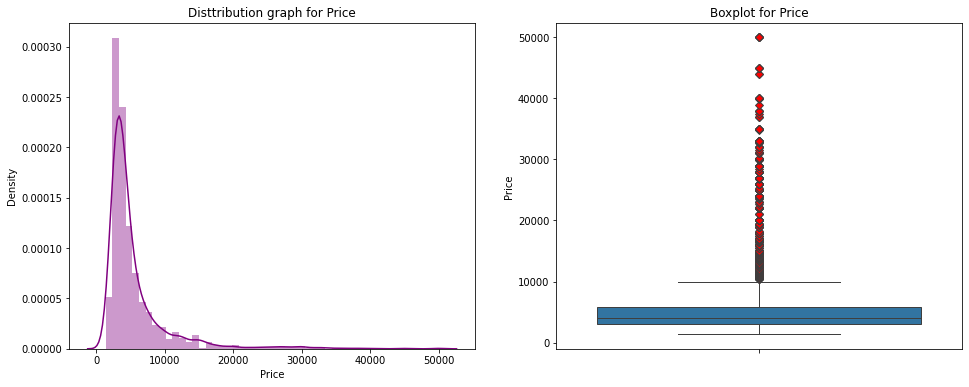

In [672]:
data = data.drop(pokoje)
dist_box(data, 'Price')

In [673]:
data['Price'].describe(percentiles = [0.75,0.99,0.999])

count     7065.000000
mean      5636.126452
std       5142.758146
min       1400.000000
50%       3990.000000
75%       5900.000000
99%      30000.000000
99.9%    45000.000000
max      50000.000000
Name: Price, dtype: float64

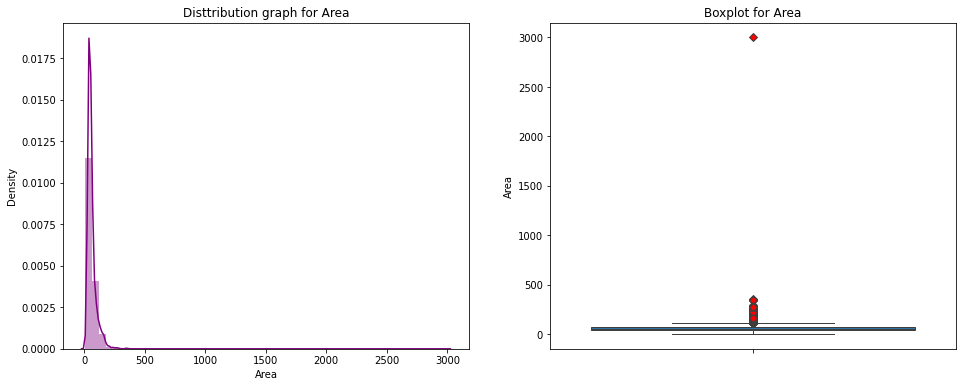

In [674]:
dist_box(data, 'Area')

Checking ads which have very low and very high value for area

In [675]:
print(data[['Link', 'Area']].sort_values(by = 'Area').head(10))
print(data[['Link', 'Area']].sort_values(by = 'Area').tail(10))

                                                   Link  Area
396   https://otodom.pl/pl/oferta/komorka-lokatorska...   4.0
47    https://otodom.pl/pl/oferta/gabinet-poczekalni...  12.0
10    https://otodom.pl/pl/oferta/apartamenty-dla-st...  13.0
2286  https://otodom.pl/pl/oferta/gotowe-biuro-serwi...  15.0
286   https://otodom.pl/pl/oferta/bezposrednio-studi...  15.0
218   https://otodom.pl/pl/oferta/kawalerka-na-polu-...  15.0
282   https://otodom.pl/pl/oferta/kawalerka-pole-mok...  15.5
444   https://otodom.pl/pl/oferta/mikromieszkanie-1-...  15.5
131   https://otodom.pl/pl/oferta/kawalerka-na-stare...  16.0
132   https://otodom.pl/pl/oferta/mieszkanie-kawaler...  16.0
                                                   Link    Area
7054  https://otodom.pl/pl/oferta/luksusowy-appt-284...   284.0
6789  https://otodom.pl/pl/oferta/fenomenalny-artyst...   300.0
6961  https://otodom.pl/pl/oferta/apartament-na-doln...   350.0
6958  https://otodom.pl/pl/oferta/luksusowy-apartame...   350.

Deleting rows not reffering to flats or having incorrect area values:

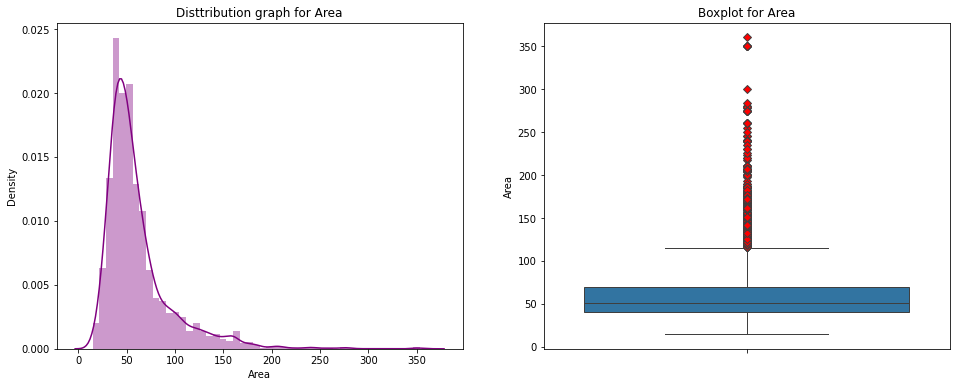

In [676]:
data = data.drop([396, 47, 10, 2286, 531])
data.reset_index(drop=True, inplace=True)
dist_box(data, 'Area')

Very high prices could indicate large area flats. 
Creating new variable calculating the price of 1m^2

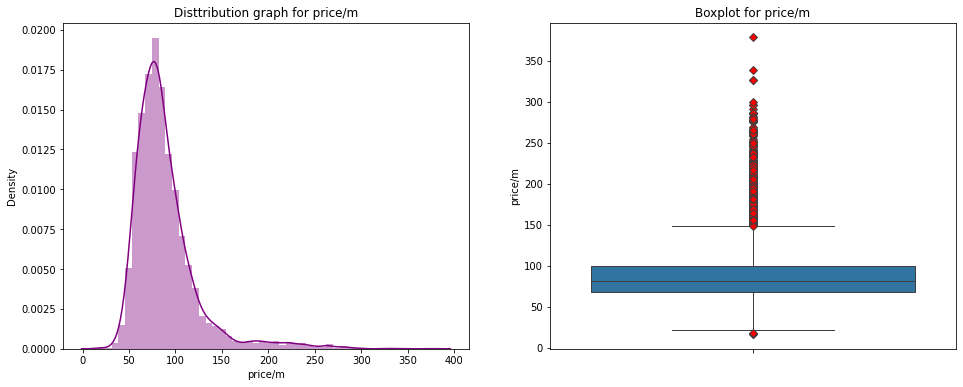

In [677]:
data['price/m'] = data['Price']/data['Area']
dist_box(data, 'price/m')
data.reset_index(drop=True, inplace=True)

checking the lowest values:

In [678]:
print(data.sort_values(by='price/m').head(10))

       Neighbourhood   Price   Area  Rooms          Building  Floor    Rent  \
924          Bielany  2700.0  161.0      4   apartamentowiec    3.0  4000.0   
1622         Mokotów  3000.0  175.0      5   apartamentowiec    2.0  9000.0   
2267         Mokotów  3250.0  177.0      4   apartamentowiec    3.0  4000.0   
3776           Wawer  4000.0  180.0      4           Unknown    1.0  6000.0   
1     Praga-Południe  1500.0   65.0      2         kamienica    2.0  2500.0   
6257          Wesoła  9900.0  360.0      6  dom wolnostojący    3.0  4000.0   
5346          Ochota  6000.0  218.0      8              blok   10.0  4000.0   
0           Targówek  1400.0   42.0      2   apartamentowiec    5.0  4000.0   
470             Wola  2500.0   73.0      3              blok   10.0  4100.0   
655             Wola  2500.0   73.0      2              blok   10.0  3900.0   

       Latitude  Longitude                                             Adress  \
924   52.311005  20.934972  ul. Hieroglif, Młocin

In [679]:
data.iloc[924]['Link']
data.iloc[1622]['Link']
data.iloc[2267]['Link']

'https://otodom.pl/pl/oferta/rodzinny-apartament-z-3-sypialniami-i-basenem-ID4kZTK'

Values are provided in EUR;
Converting to PLN:

In [680]:
data['Price'][[924, 1622, 2267]] = data['Price'][[924, 1622, 2267]] * 4.29
data['price/m'][[924, 1622, 2267]] = data['price/m'][[924, 1622, 2267]] * 4.29

Checking the highest values:

In [681]:
print(data.sort_values(by='price/m', ascending=False).head(10))

     Neighbourhood    Price   Area  Rooms         Building  Floor     Rent  \
6921   Śródmieście  25000.0   66.1      2  apartamentowiec    3.0   4000.0   
6884          Wola  22000.0   65.0      2  apartamentowiec   10.0   4000.0   
6199   Śródmieście   9150.0   28.0      1  apartamentowiec    3.0   4000.0   
6200          Wola   9150.0   28.0      1             blok    3.0   9150.0   
6982   Śródmieście  30000.0  100.0      2             blok   10.0   4000.0   
6453   Śródmieście  11850.0   40.0      2  apartamentowiec    3.0   4000.0   
6451          Wola  11850.0   40.0      1             blok    3.0  11850.0   
6244   Śródmieście   9600.0   33.0      1  apartamentowiec    3.0   4000.0   
6998   Śródmieście  30000.0  105.0      2             blok   10.0   4000.0   
6834   Śródmieście  18000.0   63.0      2          Unknown   10.0   4000.0   

       Latitude  Longitude                                             Adress  \
6921  52.231280  21.002500  ul. Złota, Śródmieście Północne,

In [682]:
data.iloc[6921]['Link']

'https://otodom.pl/pl/oferta/zlota-44-off-the-market-bez-prowizji-0-fee-ID4oZwU'

The highest values seem to be ok, (Zlota 44)

Plotting a histogram of price/m

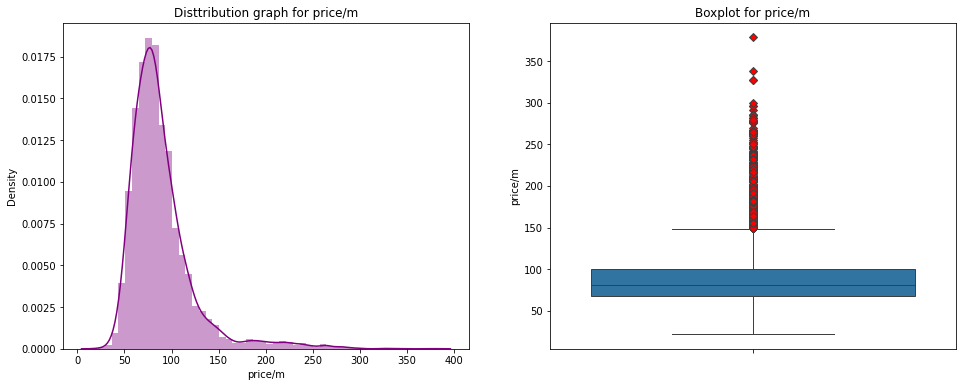

In [683]:
dist_box(data, 'price/m')

Visualizing prices by areas

<AxesSubplot:xlabel='Neighbourhood', ylabel='Price'>

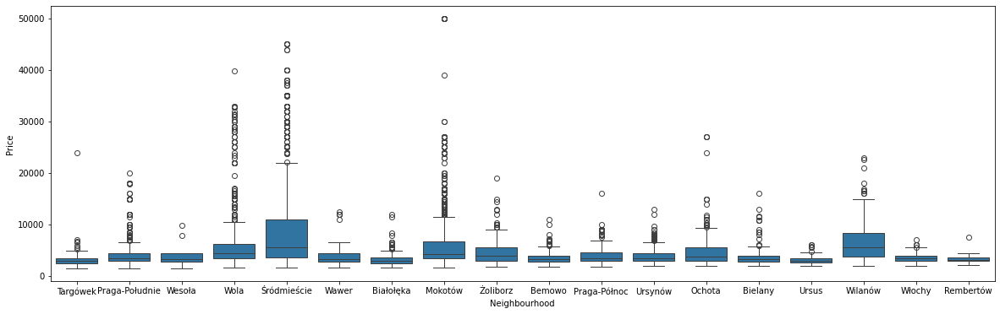

In [684]:
plt.figure(figsize=(20, 6))  
sns.boxplot(x='Neighbourhood', y='Price', data=data)

There are many outliers which could negatively affect the regression resuts. 

Indicating them using z-score and saving the indecies to remove them later from the train dataset.

In [685]:
#defining a function to compute z-scores for each region
def compute_zscore(group):
    return stats.zscore(group)

#Applying the compute_zscore function to each group separately
zscore_by_region = data.groupby('Neighbourhood')['Price'].transform(compute_zscore)

threshold = 4

outliers = np.where(zscore_by_region > threshold)

# Get unique indices of rows with outliers
outlier_indices = outliers[0].tolist()

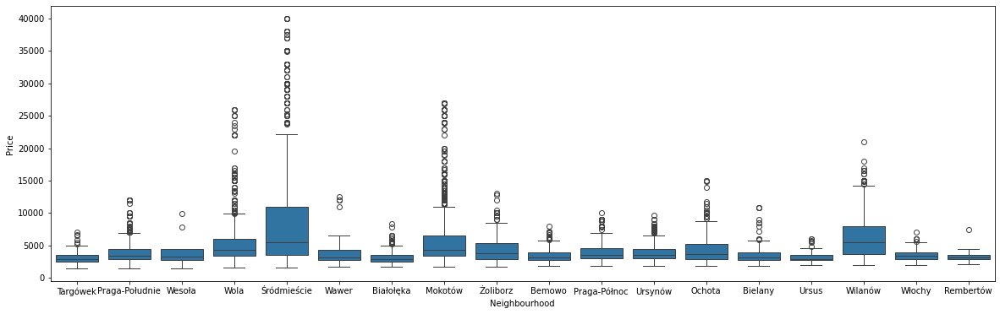

In [686]:
data["zscore_by_region"] = zscore_by_region
filtered_data = data[data["zscore_by_region"]<=threshold]
plt.figure(figsize=(20, 6))  
sns.boxplot(x='Neighbourhood', y='Price', data=filtered_data)
data = data.drop(columns='zscore_by_region')

In [687]:
data['price/m'].describe()

count    7060.000000
mean       88.753709
std        34.941404
min        22.222222
25%        67.500000
50%        81.250000
75%       100.000000
max       378.214826
Name: price/m, dtype: float64

## Visualizing price distribution by district

Creating a map with clickable markers with popups; markers are divided into three price groups, each group has it own color

In [688]:
import folium
from folium.plugins import HeatMap
import pandas as pd

# Creating a map centered at the mean Latitude and Longitude
map_center = [data['Latitude'].mean(), data['Longitude'].mean()]
mymap = folium.Map(location=map_center, zoom_start=15)

def get_color(price):
    if price <= 65:
        return 'blue'
    elif price <= 85:
        return 'green'
    else:
        return 'red'

# Adding clickable markers with popup
for idx, row in data.iterrows():
    folium.CircleMarker([row['Latitude'], row['Longitude']],
                popup=f"Price: {row['Price']}\n Rent: {row['Rent']}\n Rooms: {row['Rooms']}\n Link: {row['Link']}",
                fill=True,
                radius=0.2,
                color=get_color(row['price/m']),
                ).add_to(mymap)


#mymap.save('mymap_final.html')
mymap

Grouping price by Neighbourhood and calculating mean Price and price/m

In [689]:
grouped_price = data[['Neighbourhood', 'Price']].groupby('Neighbourhood').mean()
grouped_price_m = data[['Neighbourhood', 'price/m']].groupby('Neighbourhood').mean()
grouped_price_median = data[['Neighbourhood', 'price/m']].groupby('Neighbourhood').median()

Visualizing the results on a shapemap:

In [690]:
districts = gpd.read_file('dzielnice_Warszawy.dbf', encoding = 'utf-8')
districts

,nazwa_dzie,geometry
0,Żoliborz,"POLYGON ((633539.527 490793.934, 633542.003 49..."
1,Praga-Południe,"POLYGON ((643637.355 486100.653, 643623.409 48..."
2,Mokotów,"POLYGON ((638075.459 484924.185, 638083.540 48..."
3,Wola,"POLYGON ((635178.545 489906.766, 635181.466 48..."
4,Wilanów,"POLYGON ((643831.799 482999.436, 643838.935 48..."
5,Wesoła,"POLYGON ((649656.782 487878.522, 649437.965 48..."
6,Wawer,"POLYGON ((644054.020 482432.971, 644051.556 48..."
7,Włochy,"POLYGON ((631133.767 484862.977, 631146.760 48..."
8,Ursynów,"POLYGON ((635835.113 479216.177, 635867.908 47..."
9,Śródmieście,"POLYGON ((640812.855 485462.412, 640802.548 48..."


In [691]:
districts.rename(columns={'nazwa_dzie': 'Neighbourhood'}, inplace=True)

In [692]:
def plot_map(data, col, mean):
    merged_data = pd.merge(data, districts, on='Neighbourhood')

    gdf = gpd.GeoDataFrame(merged_data, geometry='geometry')

    fig, ax = plt.subplots(figsize=(10, 10))
    gdf.plot(column=col, cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

    plt.title(f'{mean} {col} by District')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    for x, y, label in zip(districts.geometry.centroid.x, districts.geometry.centroid.y, districts['Neighbourhood']):
        ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points", fontsize=9, color='black')

    plt.show()

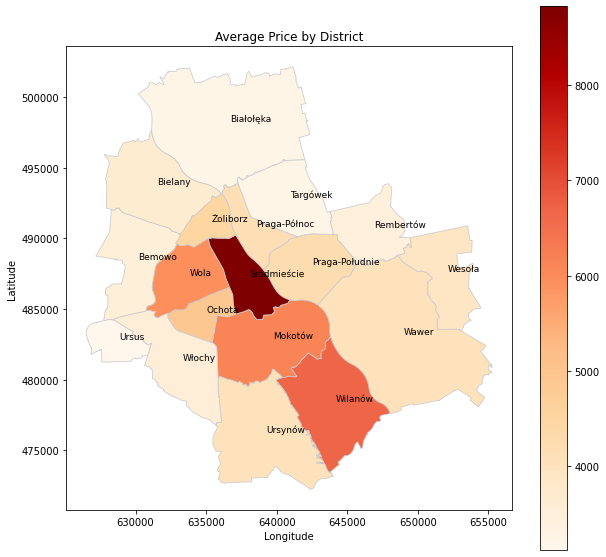

In [693]:
plot_map(grouped_price, 'Price', 'Average')

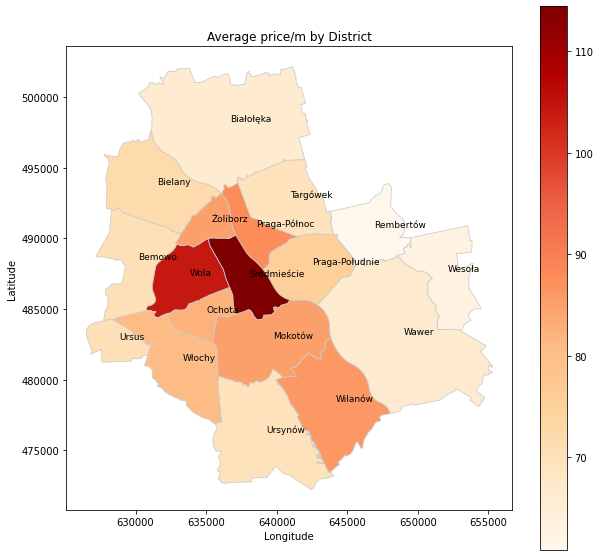

In [694]:
plot_map(grouped_price_m, 'price/m', 'Average')

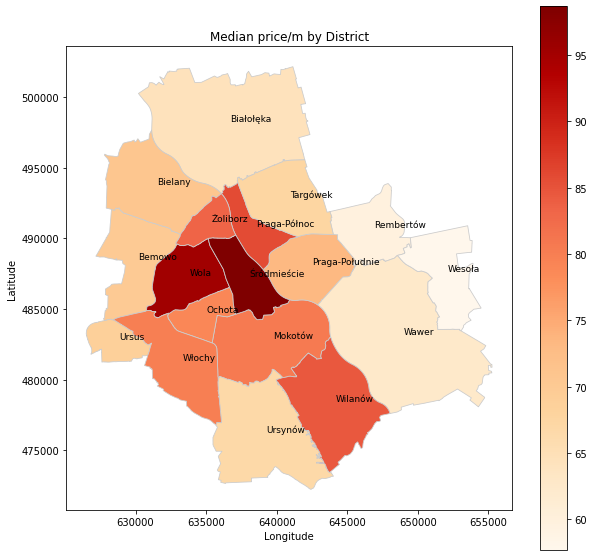

In [695]:
plot_map(grouped_price_median, 'price/m', 'Median')

Median price shows lower gap between some areas and more informative picture, as it excludes the impact of outliers like Zlota 44 or Park Lane

## Geocoding

Adding geohash variables with different precision:

In [696]:
import geohash2

def geohash_encode(lat, lon, precision=7):
    return geohash2.encode(lat, lon, precision)

data['geohash'] = data.apply(lambda row: geohash_encode(row['Latitude'], row['Longitude']), axis=1)

data['geohash_precision_5'] = data.apply(lambda row: geohash_encode(row['Latitude'], row['Longitude'], precision=5), axis=1)
data['geohash_precision_4'] = data.apply(lambda row: geohash_encode(row['Latitude'], row['Longitude'], precision=4), axis=1)
data['geohash_precision_6'] = data.apply(lambda row: geohash_encode(row['Latitude'], row['Longitude'], precision=6), axis=1)

Creating a column with distance to the city centre using Google Maps API:

In [697]:
#API_key = *hidden*

In [698]:
# import googlemaps
# import ast
# from datetime import datetime

# Replace 'YOUR_API_KEY' with your actual API key
#gmaps = googlemaps.Client(key=API_key)

# Define the coordinates for the origin and destination
#centrum = (52.2318, 21.0060)

# data['Location'] = list(zip(data['Latitude'], data['Longitude']))

# def data_distance(x, centrum):
#     return gmaps.directions(x, centrum, mode="driving", units="metric", departure_time=datetime.now())[0]['legs'][0]['distance']['text']

# data['distance_centrum'] = data['Location'].apply(lambda x: data_distance(x, centrum))

# data['distance_centrum'] = data['distance_centrum'].apply(lambda x: re.sub(r'[^0-9.,]', '', x))
# data['distance_centrum'] = data['distance_centrum'].apply(lambda x: pd.to_numeric(x, errors = 'coerce'))

# data.to_csv('data_with_distance_centrum.csv', index=False, encoding='utf-8')


Using haversine distance, calculating the distance to the city centre

In [699]:
def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees).

    Returns the distance in kilometers.
    """
    # Convert latitude and longitude from degrees to radians
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))

    # Radius of the Earth in kilometers
    R = 6371.0

    # Calculate the distance
    distance = R * c

    return distance

def calculate_distance_to_centrum(data, centrum_lat=52.1354, centrum_lon=21.0023):

    distances = []
    for index, row in data.iterrows():
        dist = haversine_distance(row['Latitude'], row['Longitude'], centrum_lat, centrum_lon)
        distances.append(dist)

    return pd.Series(distances, name='distance_to_centrum')

data['distance_to_centrum'] = calculate_distance_to_centrum(data)


def nearest(x_lat, x_lon, object):
    distance = object.apply(lambda row: haversine_distance(x_lat, x_lon, row['Latitude'], row['Longitude']), axis=1)
    calculate_distance = pd.DataFrame({'distance': distance, 'name': object['Name']})
    return calculate_distance.min()['distance']

Calculating distance to the nearest metro station using a dataset with metro stations coordinates.

Calculating the distance to the nearest green zone using the same algorythm

In [700]:
metro = pd.read_csv("metro_coord.csv", names=['Name', 'Latitude', 'Longitude'])
park = pd.read_csv("park_coord.csv", names=['Name', 'Latitude', 'Longitude'])

data['distance_metro'] = data.apply(lambda row: nearest(row['Latitude'], row['Longitude'], metro), axis=1)
data['distance_park'] = data.apply(lambda row: nearest(row['Latitude'], row['Longitude'], park), axis=1)

Adding a few variables that could be useful for the analysis:

In [701]:
data['close_to_metro'] = data['distance_metro'].apply(lambda x: 1 if x <= 0.5 else 0)
data['close_to_park'] = data['distance_park'].apply(lambda x: 1 if x <= 0.5 else 0)

In [702]:
data['new_repaired'] = data['Link'].apply(lambda x: 1 if any(substring in x for substring in 
["nowoczesn", "nowe", "nowa", "remont", "remoncie", "new", "wysoki_standard", "wysokim_standardzie", "luksus"]) else 0)

## Regression analysis

Defining input and target columns, dividing data into training and test sets

(MSI column is removed because of overfitting issues)

In [703]:
input_cols = data.drop(columns=['Price', 'price/m', 'geohash_precision_6', 'geohash_precision_5', 
    'MSI', 
    'Latitude', 'Longitude', 'Adress', 'Link', 'geohash', 'distance_park', 
    ]).columns

target_col = 'Price'

In [704]:
X_train, X_test, y_train, y_test = train_test_split(data[input_cols], data[target_col], random_state=42, test_size=0.2)

numeric_cols = X_train.select_dtypes(exclude='object').columns
categorical_cols = X_train.select_dtypes(include='object').columns

Removing outliers by region from training data

In [705]:
to_remove = []
for i in X_train.index:
    if i in outlier_indices:
        to_remove.append(i)

X_train, y_train = X_train.drop(to_remove), y_train.drop(to_remove)

**Creating a pipeline which consists of:**

-preprocessor: combines numeric and categorical transformers for scaling numeric features and encodeing categorical ones. 

-linear regression model

In [706]:
numeric_transformer = Pipeline(steps=[
    ('scaler', MinMaxScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(sparse=False, handle_unknown='ignore'))
])

# Combining transformers into a preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Creating a pipeline that includes preprocessing and the model
model_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])


In [707]:
model_pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   MinMaxScaler())]),
                                                  Index(['Area', 'Rooms', 'Floor', 'Rent', 'distance_to_centrum',
       'distance_metro', 'close_to_metro', 'close_to_park', 'new_repaired'],
      dtype='object')),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse=False))]),
                                                  Index(['Neighbourhood', 'Building', 'geohash_precision_4'], dtype='object'))])),
                ('regressor', LinearRegression())])

In [708]:
model_pipeline.fit(X_train, y_train)

# Робимо передбачення моделлю
y_train_pred = model_pipeline.predict(X_train)
y_test_pred = model_pipeline.predict(X_test)

# Разуємо лосс
train_loss = mean_squared_error(y_train, y_train_pred, squared=False)
test_loss = mean_squared_error(y_test, y_test_pred, squared=False)

print(f'Training set error: {round(train_loss, 2)}')
print(f'Test set error: {round(test_loss, 2)}')

Training set error: 2553.32
Test set error: 2523.79


The errors are quite high, however we do not have some important features: f.e overal conditions, facilities etc.

Plotting predction results vs true values

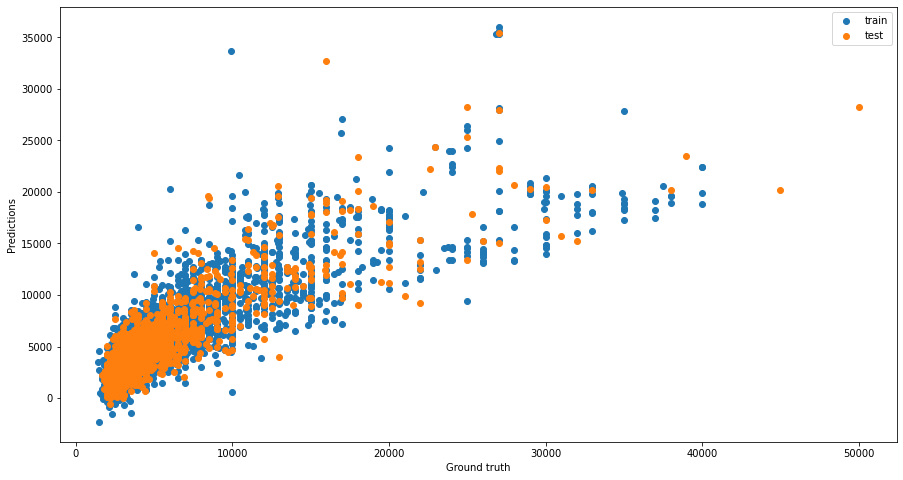

In [709]:
plt.figure(figsize=(15,8))
plt.scatter(y_train, y_train_pred, label='train')
plt.scatter(y_test, y_test_pred, label='test')
plt.xlabel('Ground truth')
plt.ylabel('Predictions')
plt.legend()

Getting the preprocessed dataset for statsmodels regression model

In [714]:
def get_feature_names_from_column_transformer(column_transformer):
    feature_names = []

    for name, transformer, features in column_transformer.transformers_:
        if name == 'num':
            feature_names.extend(features)
        elif name == 'cat':
            feature_names.extend(transformer.named_steps['onehot'].get_feature_names_out(features))

    return feature_names

# Accessing preprocessed data
preprocessed_data = preprocessor.transform(X_train)

# Convert to DataFrame (optional)
preprocessed_df = pd.DataFrame(preprocessed_data, columns=get_feature_names_from_column_transformer(preprocessor))

y_train.reset_index(drop=True, inplace=True)

In [715]:
import statsmodels.api as sm

X = sm.add_constant(preprocessed_df)

#Fitting the regression model
model = sm.OLS(y_train, X).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.694
Model:                            OLS   Adj. R-squared:                  0.692
Method:                 Least Squares   F-statistic:                     380.7
Date:                Fri, 05 Jul 2024   Prob (F-statistic):               0.00
Time:                        14:32:13   Log-Likelihood:                -51749.
No. Observations:                5586   AIC:                         1.036e+05
Df Residuals:                    5552   BIC:                         1.038e+05
Df Model:                          33                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

Running regression for test data

In [712]:
# Accessing preprocessed data
preprocessed_data = preprocessor.transform(X_test)

# Convert to DataFrame (optional)
preprocessed_df_test = pd.DataFrame(preprocessed_data, columns=get_feature_names_from_column_transformer(preprocessor))

y_test.reset_index(drop=True, inplace=True)

X = sm.add_constant(preprocessed_df_test)

#Fitting the regression model
model = sm.OLS(y_test, X).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.713
Model:                            OLS   Adj. R-squared:                  0.707
Method:                 Least Squares   F-statistic:                     107.2
Date:                Fri, 05 Jul 2024   Prob (F-statistic):               0.00
Time:                        14:31:52   Log-Likelihood:                -13053.
No. Observations:                1412   AIC:                         2.617e+04
Df Residuals:                    1379   BIC:                         2.635e+04
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

Both for training and test data R^2 is ~0.70, meaning that our model explains 70% of total variation.

Building a correlation matrix in order to check which variables we should exclude from the model

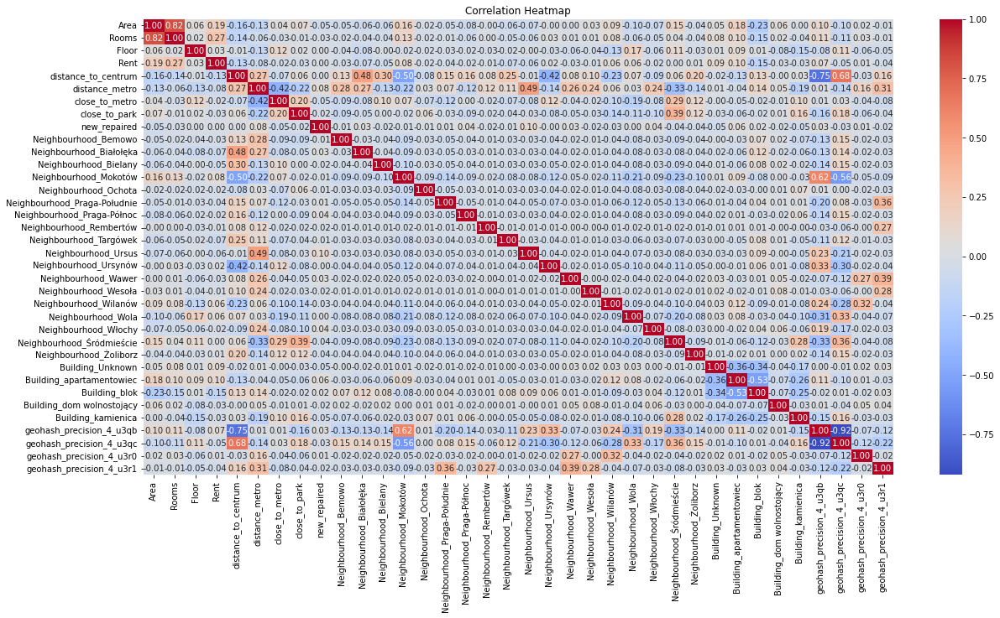

In [713]:
correlation_matrix = preprocessed_df.corr()

# Create heatmap
plt.figure(figsize=(20, 10))  
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

plt.title('Correlation Heatmap')
plt.show()

## Analysing feature importance

In [717]:
feature_names = preprocessed_df.columns

weights_df = pd.DataFrame({
    'feature': np.append(feature_names, '1'),
    'weight': np.append(model_pipeline.named_steps['regressor'].coef_, model_pipeline.named_steps['regressor'].intercept_)
})
weights_df.sort_values('weight', ascending=False).round(2).style.background_gradient()

,feature,weight
0,Area,40715.080000
36,1,2613.760000
2,Floor,1710.670000
10,Neighbourhood_Białołęka,1599.800000
25,Neighbourhood_Śródmieście,1379.840000
16,Neighbourhood_Rembertów,782.670000
28,Building_apartamentowiec,743.500000
8,new_repaired,724.400000
6,close_to_metro,580.160000
17,Neighbourhood_Targówek,534.270000


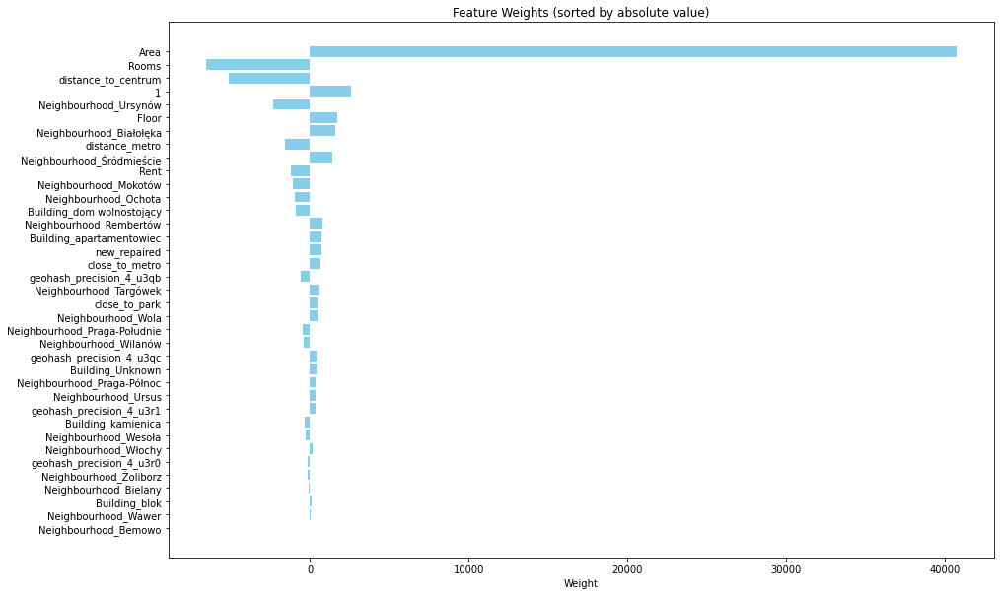

In [718]:
# Sort by absolute values of 'weight' column
weights_df['abs_weight'] = np.abs(weights_df['weight'])
weights_df_sorted = weights_df.sort_values('abs_weight', ascending=False).drop('abs_weight', axis=1)

# Round weights to 2 decimal places
weights_df_sorted['weight'] = weights_df_sorted['weight'].round(2)

# Plotting
plt.figure(figsize=(15, 10))
plt.barh(weights_df_sorted['feature'], weights_df_sorted['weight'], color='skyblue')
plt.xlabel('Weight')
plt.title('Feature Weights (sorted by absolute value)')
plt.gca().invert_yaxis()  # Invert y-axis to have the highest weight at the top
plt.show()

The results show that area, obviously, has the biggest impact on the apartment price.

Number of rooms negatively impacts price (controlling for area). 

Distance to the city centre also has a significant impact: each 1 km closer to the centre increases the price by 216PLN on average. (coef/max distance due to scaling)

Distance to metro increases price by 110PLN per 1 km closer on average.

Flats that are <500m away from park have on average 490PLN higher price.

Dummy variables for the neighbourhoods indicate the Area impact on price, controlling for other factors.


In [ ]:
# Feature Selection
# 
# def custom_rfe(train_df, target):
#     remaining_features = train_df.columns
#     removed_features = []
#     metrics = []
#     i = 1
#     while len(remaining_features) > 10:
#         print('Iteration ', i)
#         i+=1
#         print(len(remaining_features))
#         model  = LinearRegression().fit(train_df[remaining_features], target)
#         train_metrics = {'rmse': mean_squared_error(y_train, model.predict(train_df[remaining_features]), squared=False), 
#                         'R^2': r2_score(y_train, model.predict(train_df[remaining_features]))}

#         metrics.append({
#             "selected_features": copy(remaining_features),
#             "train_metrics": train_metrics
#         })

#         feature_importances = model.coef_
#         features_with_importance = list(zip(remaining_features, feature_importances))
#         least_important_feature = min(features_with_importance, key=lambda x: x[1])[0]

#         print(least_important_feature)
#         print(train_metrics)
#         remaining_features = remaining_features.drop(least_important_feature)
#         removed_features.append(least_important_feature)

#     return metrics


# metrics_progress = custom_rfe(preprocessed_df, y_train)